In [1]:
!pip install -q bertviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 157.5/157.5 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 27.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.8 MB/s eta 0:00:00:00:0100:01


In [2]:
from transformers import AutoTokenizer
from bertviz.transformers_neuron_view import BertModel
from bertviz.neuron_view import show

In [3]:
model_ckpt = "bert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
model = BertModel.from_pretrained(model_ckpt)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

100%|██████████| 440473133/440473133 [00:17<00:00, 25765522.55B/s]


In [4]:
text = "The cat sat on the river bank. It wanted to catch fish."
show(model, "bert", tokenizer, text, display_mode="light", layer=0, head=8)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [5]:
inputs = tokenizer(text, return_tensors="pt", add_special_tokens=False)
inputs.input_ids

tensor([[1996, 4937, 2938, 2006, 1996, 2314, 2924, 1012, 2009, 2359, 2000, 4608,
         3869, 1012]])

In [6]:
# Embedding
from torch import nn
from transformers import AutoConfig

In [7]:
config = AutoConfig.from_pretrained(model_ckpt)    # Load config.json file associated with our model checkpoint
token_emb = nn.Embedding(config.vocab_size, config.hidden_size)
token_emb

Embedding(30522, 768)

Each input ID will be mapped to one of 30522 embedding vector stored in nn.Embedding look up table, each with a dim / size of 768.

**Note**: Each embeddings are independent of their context in this step. E.g. the word "bank" in river bank and financial institution bank's embedding would be same. 

- The attention layers help to inform the representation of each token with their content to create contextualized or context-aware embeddings.

In [8]:
input_embeds = token_emb(inputs.input_ids)
input_embeds.size()

torch.Size([1, 14, 768])

In [9]:
import torch
from math import sqrt

In [10]:
query = key = value = input_embeds

In [11]:
key.size()

torch.Size([1, 14, 768])

In [12]:
key.size(-1)

768

In [13]:
key.transpose(1, 2).size()

torch.Size([1, 768, 14])

In [14]:
dim_k = key.size(-1)
scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(dim_k)    # Batched matrix multiplication
scores.size()

torch.Size([1, 14, 14])

In [15]:
import torch.nn.functional as F


In [16]:
weights = F.softmax(scores, dim=-1)
weights

tensor([[[5.0000e-01, 1.3946e-14, 3.3920e-14, 2.4281e-14, 5.0000e-01,
          8.0177e-14, 2.2149e-13, 3.8455e-13, 4.2331e-14, 2.4054e-13,
          1.9092e-13, 8.4367e-14, 1.8444e-14, 3.8455e-13],
         [9.5229e-14, 1.0000e+00, 3.5320e-12, 6.7890e-13, 9.5229e-14,
          1.8266e-12, 1.9051e-12, 1.1906e-13, 2.3823e-13, 1.1016e-12,
          3.5313e-13, 2.4503e-12, 2.4370e-11, 1.1906e-13],
         [1.4358e-13, 2.1896e-12, 1.0000e+00, 1.5673e-12, 1.4358e-13,
          2.3497e-13, 1.1619e-13, 1.2649e-13, 3.1178e-12, 3.7859e-13,
          1.1234e-13, 7.7511e-13, 3.3923e-13, 1.2649e-13],
         [1.5948e-13, 6.5303e-13, 2.4319e-12, 1.0000e+00, 1.5948e-13,
          1.0891e-12, 7.2958e-13, 5.0891e-13, 3.4636e-12, 1.3437e-12,
          1.2222e-12, 6.5599e-13, 8.1624e-13, 5.0891e-13],
         [5.0000e-01, 1.3946e-14, 3.3920e-14, 2.4281e-14, 5.0000e-01,
          8.0177e-14, 2.2149e-13, 3.8455e-13, 4.2331e-14, 2.4054e-13,
          1.9092e-13, 8.4367e-14, 1.8444e-14, 3.8455e-13],
     

In [17]:
weights.sum(dim=-1)

tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]],
       grad_fn=<SumBackward1>)

In [18]:
weights.sum(dim=1)

tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]],
       grad_fn=<SumBackward1>)

In [19]:
weights.sum(dim=2)

tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]],
       grad_fn=<SumBackward1>)

In [20]:
attn_op = torch.bmm(weights, value)
attn_op.size()

torch.Size([1, 14, 768])

Self-attention can be viewed as a fancy-form of `averaging`.

In [21]:
def scaled_dot_prod_attn(query, key, value):
    attn_scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(key.size(-1))
    attn_wts = F.softmax(attn_scores, dim=-1)
    attn_ops = torch.bmm(attn_wts, value)

    return attn_ops

In [22]:
class AttentionHead(nn.Module):
    
    def __init__(self, embed_dim, head_dim):
        super().__init__()
        self.q = nn.Linear(embed_dim, head_dim)
        self.k = nn.Linear(embed_dim, head_dim)
        self.v = nn.Linear(embed_dim, head_dim)

    def forward(self, hidden_state):
        attn_ops = scaled_dot_prod_attn(self.q(hidden_state), self.k(hidden_state), self.v(hidden_state))
        return attn_ops

In [23]:
class MultiHeadAttention(nn.Module):

    def __init__(self, config):
        super().__init__()
        embed_dim = config.hidden_size
        num_heads = config.num_attention_heads
        head_dim = embed_dim // num_heads    # BERT has 12 attention heads and 768 dimensional embeddings => 768/12 = 64 dimension for each head
        self.heads = nn.ModuleList(
            [AttentionHead(embed_dim, head_dim) for _ in range(num_heads)]
        )
        self.output_linear = nn.Linear(embed_dim, embed_dim)

    def forward(self, hidden_state):
        x = torch.cat([h(hidden_state) for h in self.heads], dim=-1)
        x = self.output_linear(x)
        return x

In [24]:
multihead_attn = MultiHeadAttention(config)
attn_op = multihead_attn(input_embeds)
attn_op.size()

torch.Size([1, 14, 768])

In [25]:
from bertviz import head_view
from transformers import AutoModel

In [26]:
model = AutoModel.from_pretrained(model_ckpt, output_attentions=True)

sentence_a = "time flies like an arrow"
sentence_b = "fruit flies like a banana"

2025-06-16 03:29:40.022180: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750044580.322653      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750044580.405483      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [27]:
viz_inputs = tokenizer(sentence_a, sentence_b, return_tensors="pt")
attention = model(**viz_inputs).attentions

BertSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [28]:
viz_inputs.token_type_ids

tensor([[0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1]])

In [29]:
viz_inputs.token_type_ids == 0

tensor([[ True,  True,  True,  True,  True,  True,  True, False, False, False,
         False, False, False]])

In [30]:
(viz_inputs.token_type_ids == 0).sum(dim=1)

tensor([7])

In [31]:
sentence_b_start_idx = (viz_inputs.token_type_ids == 0).sum(dim=1)

In [32]:
viz_inputs.input_ids    # 2D tensor

tensor([[  101,  2051, 10029,  2066,  2019,  8612,   102,  5909, 10029,  2066,
          1037, 15212,   102]])

In [33]:
viz_inputs.input_ids[0]

tensor([  101,  2051, 10029,  2066,  2019,  8612,   102,  5909, 10029,  2066,
         1037, 15212,   102])

In [34]:
tokens = tokenizer.convert_ids_to_tokens(viz_inputs.input_ids[0])

In [35]:
head_view(attention, tokens, sentence_b_start_idx, heads=[8])

<IPython.core.display.Javascript object>

In [36]:
head_view(attention, tokens, sentence_b_start_idx, heads=[1, 8])

<IPython.core.display.Javascript object>

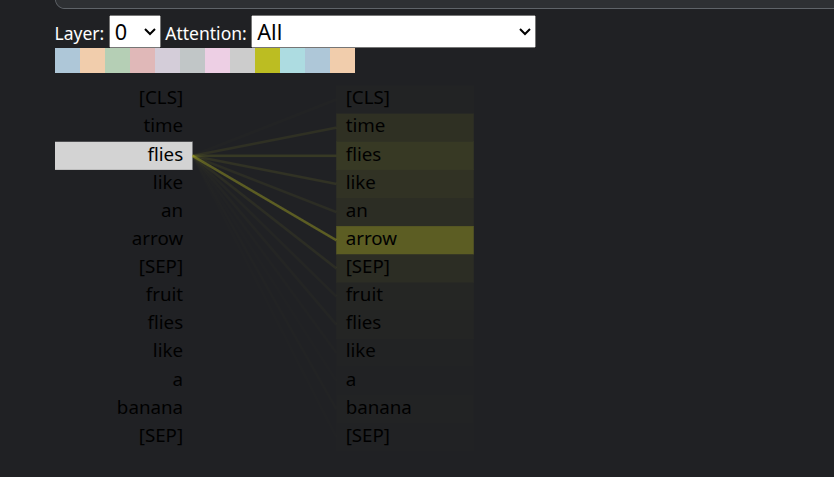

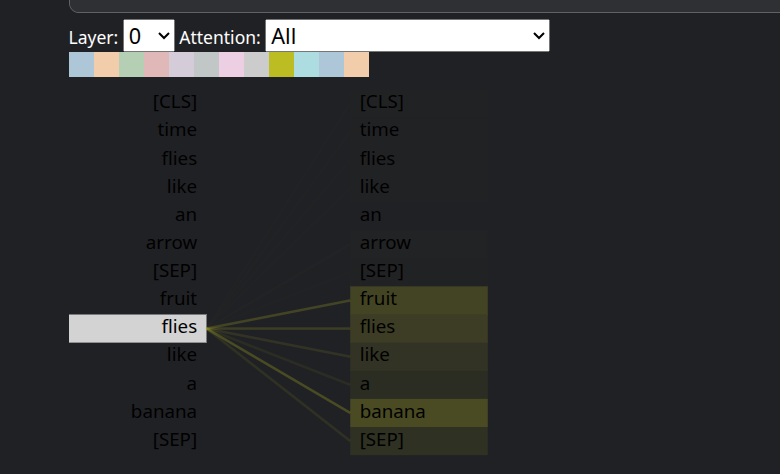

## The Feed-Forward Layer

A rule of thumb from the literature is for the hidden size of
the first layer to be four times the size of the embeddings, and a GELU activation
function is most commonly used. 

This is where most of the capacity and memorization is hypothesized to happen, and it’s the part that is most often scaled when scaling
up the models.

In [37]:
class FeedForward(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.linear_1 = nn.Linear(config.hidden_size, config.intermediate_size)
        self.linear_2 = nn.Linear(config.intermediate_size, config.hidden_size)
        self.gelu = nn.GELU()
        self.dropout = nn.Dropout(config.hidden_dropout_prob)

    def forward(self, x):
        x = self.linear_1(x)
        x = self.gelu(x)
        x = self.linear_2(x)
        x = self.dropout(x)

        return x

In [38]:
feed_forward = FeedForward(config)
ff_ops = feed_forward(attn_op)
ff_ops.size()

torch.Size([1, 14, 768])

## Layer Normalization

**Post layer normalizaiton**: 
- Places layer norm betn skip connections.
- Tricky to train from scratch as gradients diverge.
- So a concept called *learning rate warm-up* is used where lr is gradually increased from a small value to some max value during training.


**Pre layer normalization**: 
- Places layer norm within the span of skip connections.
- Much more stable during training.
- Does not usually require learning-rate warm-up.

In [39]:
class TransformerEncoderLayer(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.layer_norm_1 = nn.LayerNorm(config.hidden_size)
        self.layer_norm_2 = nn.LayerNorm(config.hidden_size)
        self.attention = MultiHeadAttention(config)
        self.feed_forward = FeedForward(config)

    def forward(self, x):
        hidden_state = self.layer_norm_1(x)
        x = x + self.attention(hidden_state)    # Skip connection + MHA
        x = x + self.feed_forward(self.layer_norm_2(x))

        return x
        

In [40]:
encoder_layer = TransformerEncoderLayer(config)
input_embeds.shape, encoder_layer(input_embeds).size()

(torch.Size([1, 14, 768]), torch.Size([1, 14, 768]))

## Positional Embeddings

- One of the approach is to use a `learnable parameter`.
- Computed exactly the same way as the token embeddings but using position index instead of token IDs.


In [41]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f"Using device: {device}")

In [42]:
class Embeddings(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.token_embeddings = nn.Embedding(config.vocab_size, config.hidden_size)
        self.position_embeddings = nn.Embedding(config.max_position_embeddings, config.hidden_size)
        self.layer_norm = nn.LayerNorm(config.hidden_size, eps=1e-12)
        self.dropout = nn.Dropout()

    def forward(self, input_ids):
        seq_len = input_ids.size(1)
        position_ids = torch.arange(seq_len, dtype=torch.long).unsqueeze(0)
        token_embeddings = self.token_embeddings(input_ids)
        pos_embeds = self.position_embeddings(position_ids)
        embeds = token_embeddings + pos_embeds
        embeds = self.layer_norm(embeds)
        embeds = self.dropout(embeds)

        return embeds
    

In [43]:
embedding_layer = Embeddings(config)
embedding_layer(inputs.input_ids).size()

torch.Size([1, 14, 768])

In [44]:
class TransformerEncoder(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.embeds = Embeddings(config)
        self.enc_layers = nn.ModuleList(
            [TransformerEncoderLayer(config) for _ in range(config.num_hidden_layers)]
        )

    def forward(self, x):
        x = self.embeds(x)
        for layer in self.enc_layers:
            x = layer(x)
        return x

In [45]:
encoder = TransformerEncoder(config)
encoder(inputs.input_ids).size()

torch.Size([1, 14, 768])

## Classification Head

In [46]:
class TransformerForSequenceClassification(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.encoder = TransformerEncoder(config)
        self.dropout = nn.Dropout(config.hidden_dropout_prob)
        self.classifier = nn.Linear(config.hidden_size, config.num_labels)

    def forward(self, x):
        x = self.encoder(x)[:, 0, :]    # Select hidden state of [CLS] token from each batch
        x = self.dropout(x)
        x = self.classifier(x)
        return x
        

In [47]:
config.num_labels = 3
encoder_classifier = TransformerForSequenceClassification(config)
encoder_classifier(inputs.input_ids).size()

torch.Size([1, 3])

## Decoder

### Masked Multi-Head Attention

In [48]:
seq_len = inputs.input_ids.size(-1)
seq_len

14

In [49]:
torch.ones(seq_len, seq_len)

tensor([[1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [50]:
torch.tril(torch.ones(seq_len, seq_len))

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [51]:
torch.tril(torch.ones(seq_len, seq_len)).size()

torch.Size([14, 14])

In [52]:
torch.tril(torch.ones(seq_len, seq_len)).unsqueeze(0).size()

torch.Size([1, 14, 14])

In [53]:
mask = torch.tril(torch.ones(seq_len, seq_len)).unsqueeze(0)
mask[0]

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.],
        [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [54]:
scores.masked_fill(mask==0, -float("inf"))

tensor([[[28.9433,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [-2.2671, 27.7154,    -inf,    -inf,    -inf,    -inf,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [-1.3783,  1.3463, 28.1936,    -inf,    -inf,    -inf,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [-1.7126, -0.3029,  1.0119, 27.7543,    -inf,    -inf,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [28.9433, -2.2671, -1.3783, -1.7126, 28.9433,    -inf,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [-0.5181,  0.6869, -0.8857,  0.2086, -0.5181, 26.8568,    -inf,
             -inf,    -inf,    -inf,    -inf,    -inf,    -inf,    -inf],
         [ 0.4981,  0.7289, -1.5900, -0.1920,  0.4981,  1.0798, 25.4004,
             -inf,    -inf,    -inf,    -inf,

In [55]:
def scaled_dot_prod_attn(query, key, value, mask=None):
    attn_scores = torch.bmm(query, key.transpose(1, 2)) / sqrt(key.size(-1))
    if mask is not None:
        attn_scores = attn_scores.masked_fill(mask==0, -float("inf"))
    attn_wts = F.softmax(attn_scores, dim=-1)
    attn_ops = torch.bmm(attn_wts, value)

    return attn_ops

## Simple training 

In [56]:
import torch
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
import torch.nn.functional as F

In [57]:
class ToyDataset(Dataset):
    def __init__(self, vocab_size, seq_len, num_samples, num_labels):
        self.vocab_size = vocab_size
        self.seq_len = seq_len
        self.num_samples = num_samples
        self.num_labels = num_labels
        self.data = torch.randint(0, vocab_size, (num_samples, seq_len))
        self.labels = torch.randint(0, num_labels, (num_samples,))
        
    def __len__(self):
        return self.num_samples
    
    def __getitem__(self, idx):
        return self.data[idx], self.labels[idx]

In [58]:
vocab_size = config.vocab_size
seq_len = 16
num_samples = 1000
num_labels = 3
batch_size = 32
epochs = 5
lr = 1e-3

In [59]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cpu


In [60]:
dataset = ToyDataset(vocab_size, seq_len, num_samples, num_labels)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [61]:
model = TransformerForSequenceClassification(config).to(device)
model.train()
optimizer = Adam(model.parameters(), lr=lr)

In [65]:
val_samples = 200
val_dataset = ToyDataset(vocab_size, seq_len, val_samples, num_labels)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size)

In [66]:
for epoch in range(epochs):
    # Training 
    model.train()
    total_loss = 0
    for batch_idx, (inputs, labels) in enumerate(dataloader):
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)  # [batch_size, num_labels]
        loss = F.cross_entropy(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_train_loss = total_loss / len(dataloader)

    # Validation 
    model.eval()
    val_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            loss = F.cross_entropy(outputs, labels)
            val_loss += loss.item()

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    avg_val_loss = val_loss / len(val_dataloader)
    val_accuracy = correct / total

    # Epoch Summary
    print(
        f"Epoch {epoch+1}/{epochs} - "
        f"Train Loss: {avg_train_loss:.4f} | "
        f"Val Loss: {avg_val_loss:.4f} | "
        f"Val Acc: {val_accuracy:.4f}"
    )


Epoch 1/5 - Train Loss: 1.3779 | Val Loss: 1.4415 | Val Acc: 0.3400
Epoch 2/5 - Train Loss: 1.5946 | Val Loss: 1.4800 | Val Acc: 0.3550
Epoch 3/5 - Train Loss: 1.5590 | Val Loss: 1.3948 | Val Acc: 0.3000
Epoch 4/5 - Train Loss: 1.3294 | Val Loss: 1.4090 | Val Acc: 0.3000
Epoch 5/5 - Train Loss: 1.3309 | Val Loss: 1.9430 | Val Acc: 0.3000
